### Setup Environment:

In [1]:
from src.embeddings import load_data, split_dataset, train_and_evaluate_model

# Class weights
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import pandas as pd
import os

# Models
# Random forest
from sklearn.ensemble import RandomForestClassifier
# Logistic regression
from sklearn.linear_model import LogisticRegression
# Support vector machine
from sklearn.svm import SVC
# Decision tree
from sklearn.tree import DecisionTreeClassifier

## Evaluate the Embeddings

In [2]:
def run_experiments(LABELS_PATH, LABEL, EMBEDDINGS_BACKBONE, EMBEDDINGS_DIR, TEST_SIZE, CLASS_WEIGTHS, NORMAL=False, DR_ICDR_3=False, quality=False):
    
    # Get the dataset
    if quality:
        X_quality, y_quality, X_bad_quality, y_bad_quality = load_data(labels_path=LABELS_PATH, backbone=EMBEDDINGS_BACKBONE, label=LABEL, directory=EMBEDDINGS_DIR, normal=NORMAL, DR_ICDR_3=DR_ICDR_3, quality=quality)
    else:    
        X, y = load_data(labels_path=LABELS_PATH, backbone=EMBEDDINGS_BACKBONE, label=LABEL, directory=EMBEDDINGS_DIR, normal=NORMAL, DR_ICDR_3=DR_ICDR_3, quality=quality)

    if quality:
        X_train_quality, X_test_quality, y_train_quality, y_test_quality = split_dataset(X_quality, y_quality, test_size=TEST_SIZE)
        X_train_bad_quality, X_test_bad_quality, y_train_bad_quality, y_test_bad_quality = split_dataset(X_bad_quality, y_bad_quality, test_size=TEST_SIZE)
        X_train = np.concatenate((X_train_quality, X_train_bad_quality))
        y_train = np.concatenate((y_train_quality, y_train_bad_quality))
        
    else:
        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = split_dataset(X, y, test_size=TEST_SIZE)
    
    if quality:
        # Train and evaluate with good and bad quality subsets
        print('#'*50, ' GOOD QUALITY ', '#'*50)
        # Define a list of models to test
        if CLASS_WEIGTHS:
            class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
            # Create a dictionary from class labels and weights
            class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
            print(f'Setting class weigths to: {class_weights}')

            models = [
                #("SVM", SVC(class_weight=class_weights, probability=True)),
                ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
                #('Decision Tree', DecisionTreeClassifier(class_weight=class_weights)),
            ]
        else:
            models = [
                #("SVM", SVC(probability=True)),
                ("Logistic Regression", LogisticRegression())
                #('Decision Tree', DecisionTreeClassifier()),
            ]
        # Run the experiments
        print('#'*50, ' Train all evaluate good quality ', '#'*50)
        train_and_evaluate_model(X_train, X_test_quality, y_train, y_test_quality, models=models)
        
        print('#'*50, ' Train all evaluate bad quality ', '#'*50)
        train_and_evaluate_model(X_train, X_test_bad_quality, y_train, y_test_bad_quality, models=models)

        
    else:
        # Define a list of models to test
        if CLASS_WEIGTHS:
            class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
            # Create a dictionary from class labels and weights
            class_weights = {class_label: weight for class_label, weight in zip(np.unique(y_train), class_weights)}
            print(f'Setting class weigths to: {class_weights}')

            models = [
                #("SVM", SVC(class_weight=class_weights, probability=True)),
                ("Logistic Regression", LogisticRegression(class_weight=class_weights)),
                ('Decision Tree', DecisionTreeClassifier(class_weight=class_weights)),
            ]
        else:
            models = [
                #("SVM", SVC(probability=True)),
                ("Logistic Regression", LogisticRegression())
                ('Decision Tree', DecisionTreeClassifier()),
            ]
            
        # Run the experiments
        train_and_evaluate_model(X_train, X_test, y_train, y_test, models=models)

#### Constants

In [3]:
# Constants:
LABELS_PATH = '/home/opc/Retina/BRSET/labels.csv'
EMBEDDINGS_BACKBONE = 'retfound'
EMBEDDINGS_DIR = 'Embeddings'
TEST_SIZE = 0.3
CLASS_WEIGTHS = True
quality = True

### Sex Prediction

Training set size is: 9995 rows and 1024 columns
Test set size is: 4284 rows and 1024 columns


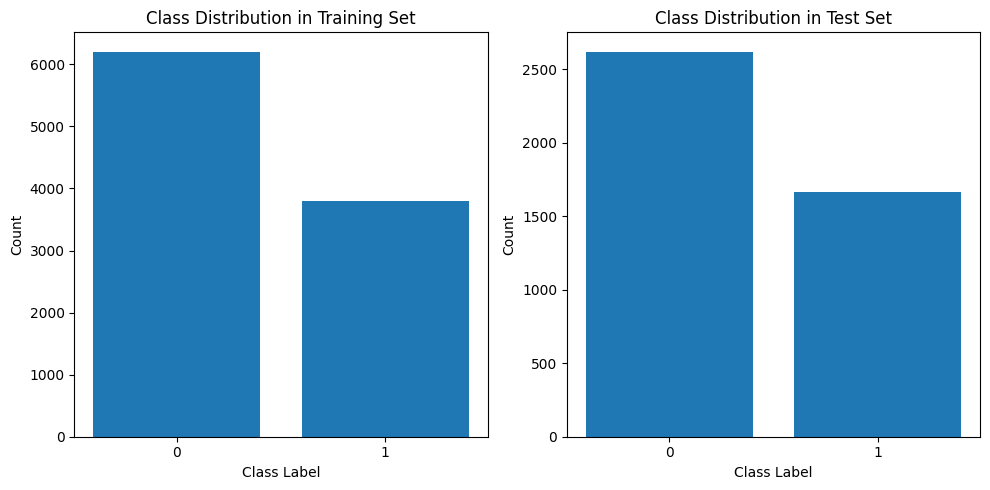

Training set size is: 1390 rows and 1024 columns
Test set size is: 597 rows and 1024 columns


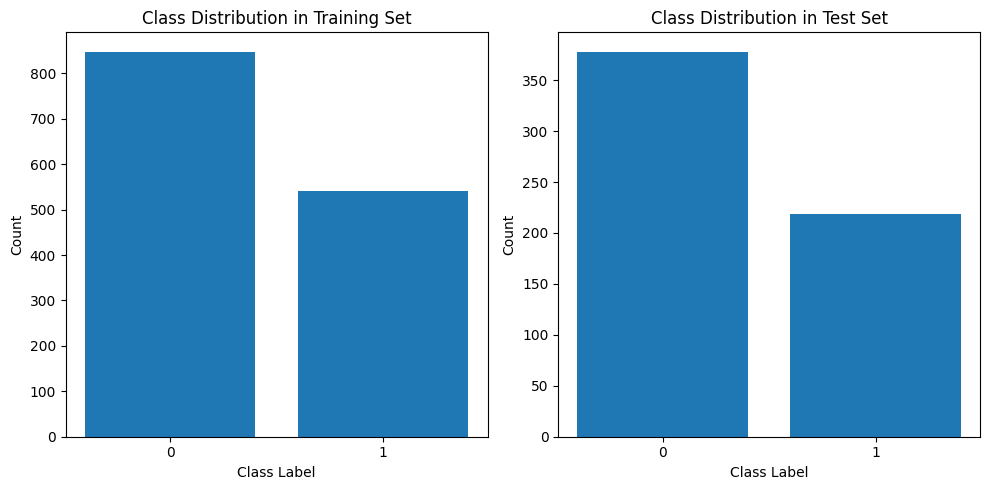

##################################################  GOOD QUALITY  ##################################################
Setting class weigths to: {0: 0.8071033602722246, 1: 1.3140581717451523}
##################################################  Train all evaluate good quality  ##################################################


####################  Logistic Regression  ####################


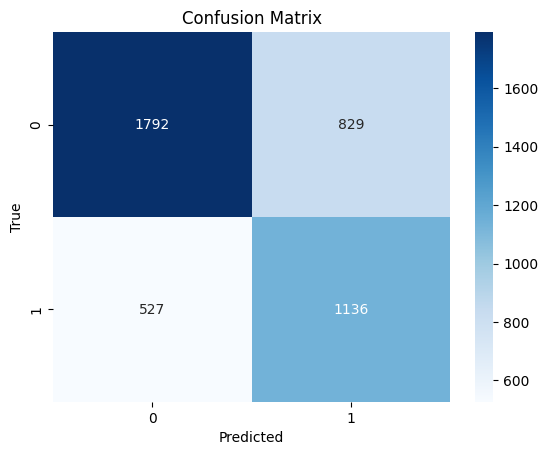

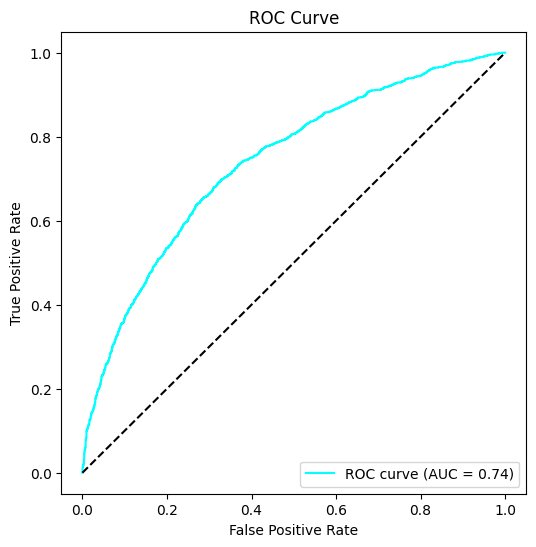

              precision    recall  f1-score   support

           0       0.77      0.68      0.73      2621
           1       0.58      0.68      0.63      1663

    accuracy                           0.68      4284
   macro avg       0.68      0.68      0.68      4284
weighted avg       0.70      0.68      0.69      4284

##################################################  Train all evaluate bad quality  ##################################################


####################  Logistic Regression  ####################


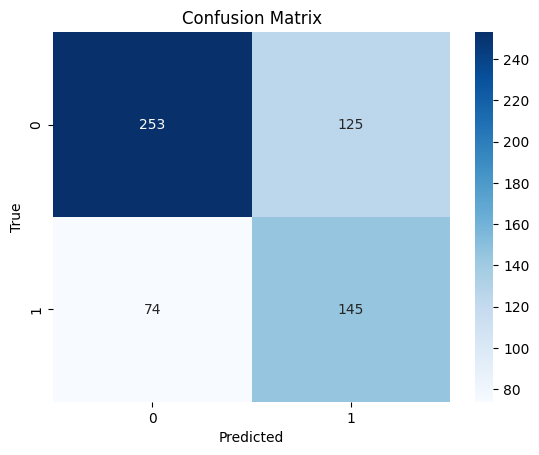

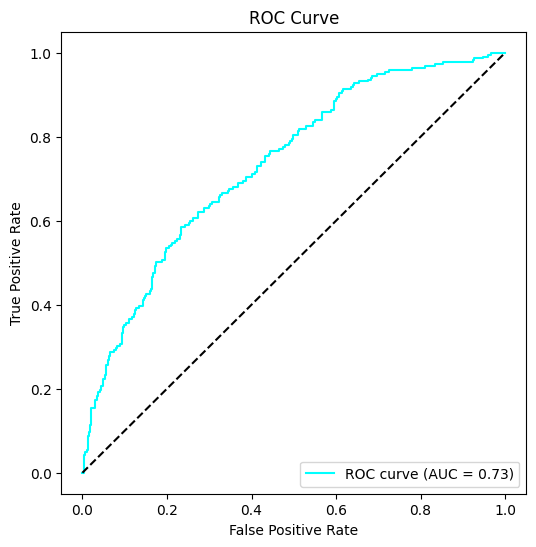

              precision    recall  f1-score   support

           0       0.77      0.67      0.72       378
           1       0.54      0.66      0.59       219

    accuracy                           0.67       597
   macro avg       0.66      0.67      0.66       597
weighted avg       0.69      0.67      0.67       597



In [4]:
LABEL = 'patient_sex'

run_experiments(LABELS_PATH, LABEL, EMBEDDINGS_BACKBONE, EMBEDDINGS_DIR, TEST_SIZE, CLASS_WEIGTHS, quality=quality)

## Diabetic Retinopathy

### 5 Class

Training set size is: 9995 rows and 1024 columns
Test set size is: 4284 rows and 1024 columns


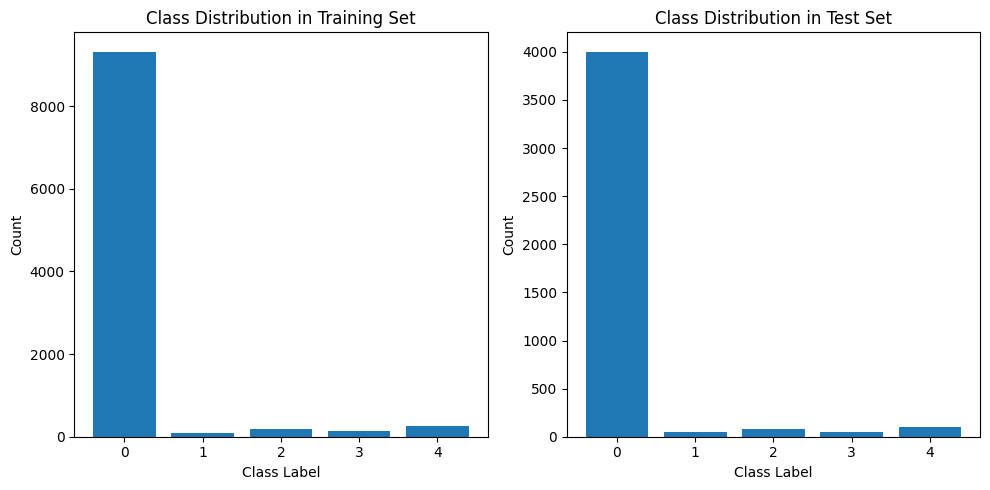

Training set size is: 1390 rows and 1024 columns
Test set size is: 597 rows and 1024 columns


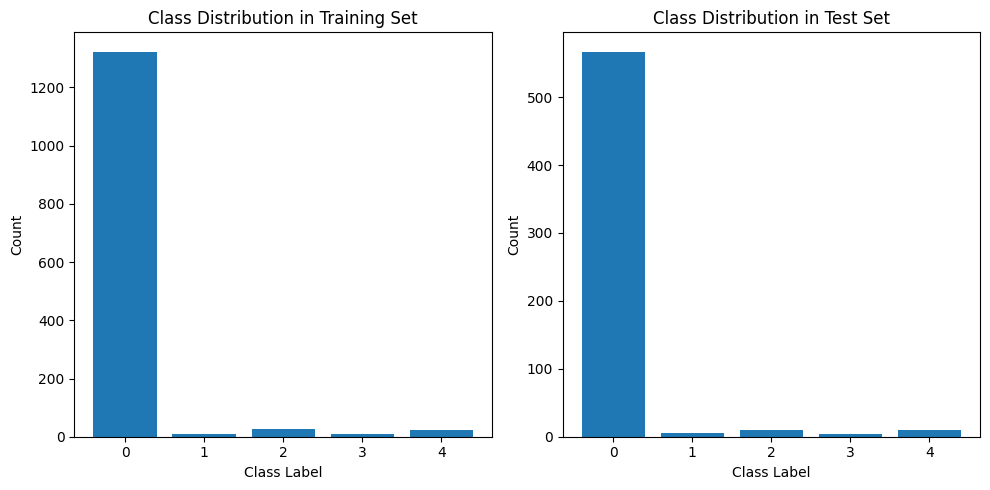

##################################################  GOOD QUALITY  ##################################################
Setting class weigths to: {0: 0.21400375939849625, 1: 21.083333333333332, 2: 10.444954128440367, 3: 16.381294964028775, 4: 8.132142857142858}
##################################################  Train all evaluate good quality  ##################################################


####################  Logistic Regression  ####################


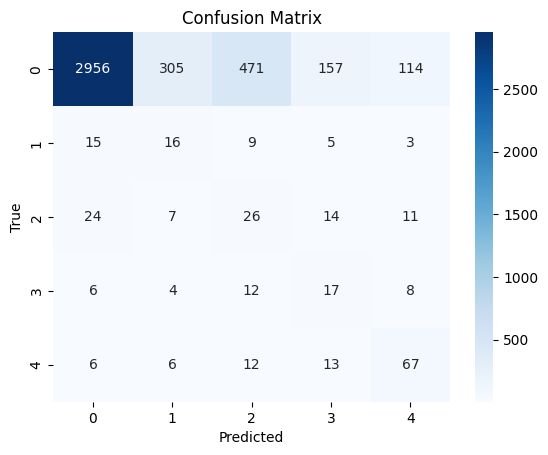

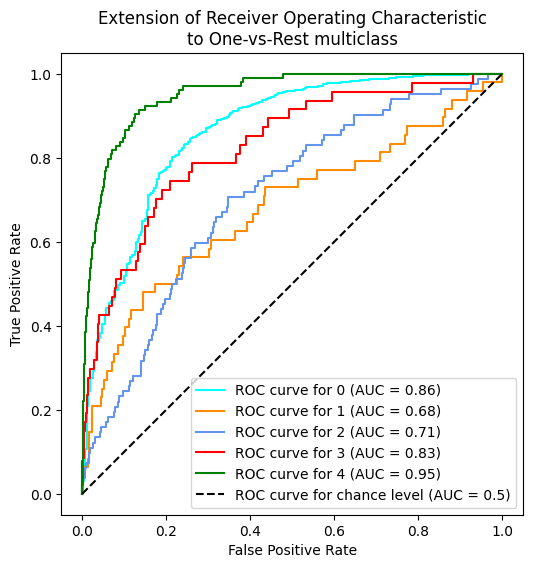

              precision    recall  f1-score   support

           0       0.98      0.74      0.84      4003
           1       0.05      0.33      0.08        48
           2       0.05      0.32      0.08        82
           3       0.08      0.36      0.13        47
           4       0.33      0.64      0.44       104

    accuracy                           0.72      4284
   macro avg       0.30      0.48      0.32      4284
weighted avg       0.93      0.72      0.80      4284

##################################################  Train all evaluate bad quality  ##################################################


####################  Logistic Regression  ####################


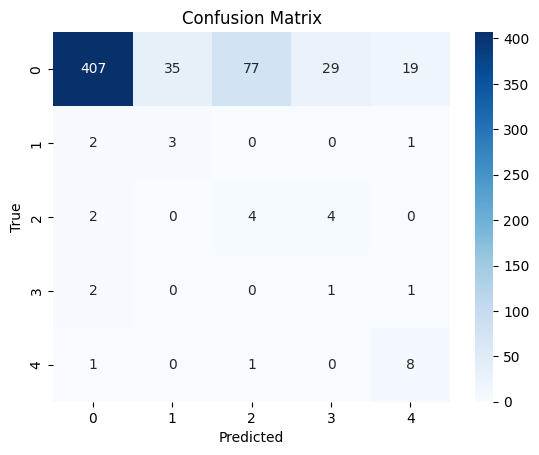

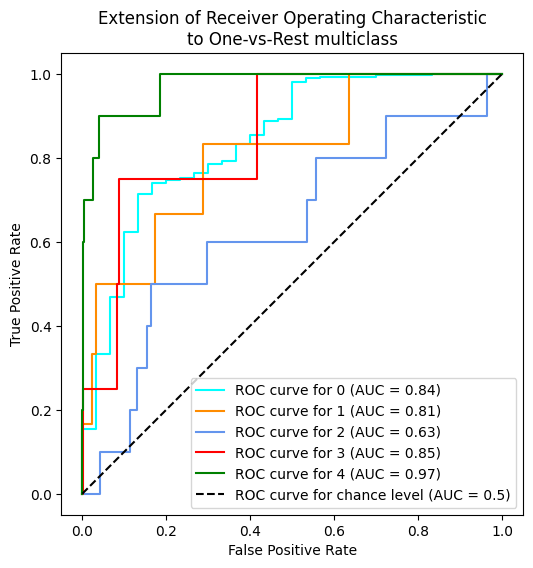

              precision    recall  f1-score   support

           0       0.98      0.72      0.83       567
           1       0.08      0.50      0.14         6
           2       0.05      0.40      0.09        10
           3       0.03      0.25      0.05         4
           4       0.28      0.80      0.41        10

    accuracy                           0.71       597
   macro avg       0.28      0.53      0.30       597
weighted avg       0.94      0.71      0.80       597



In [4]:
LABEL = 'DR_ICDR'
DR_ICDR_3 = False

run_experiments(LABELS_PATH, LABEL, EMBEDDINGS_BACKBONE, EMBEDDINGS_DIR, TEST_SIZE, CLASS_WEIGTHS, DR_ICDR_3=DR_ICDR_3, quality=quality)

### 3 Class

Training set size is: 9995 rows and 1024 columns
Test set size is: 4284 rows and 1024 columns


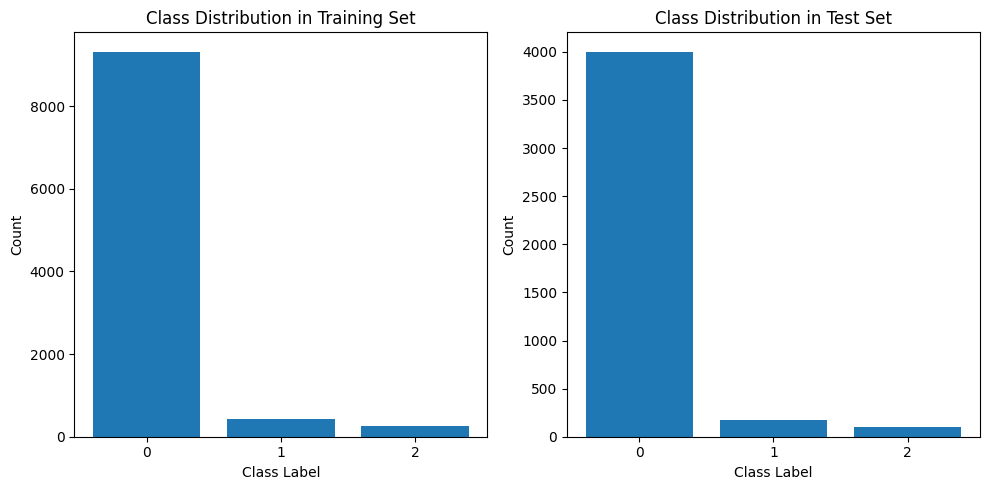

Training set size is: 1390 rows and 1024 columns
Test set size is: 597 rows and 1024 columns


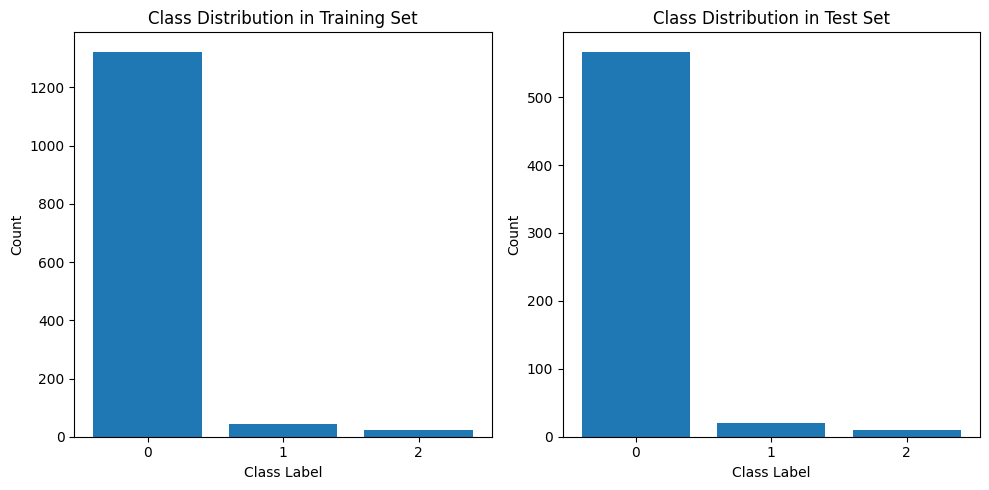

##################################################  GOOD QUALITY  ##################################################
Setting class weigths to: {0: 0.3566729323308271, 1: 8.161290322580646, 2: 13.553571428571429}
##################################################  Train all evaluate good quality  ##################################################


####################  Logistic Regression  ####################


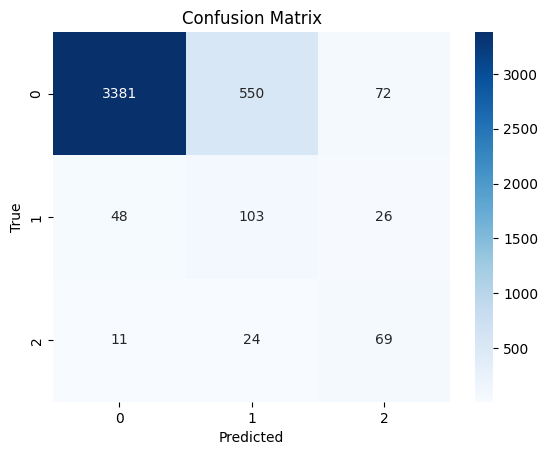

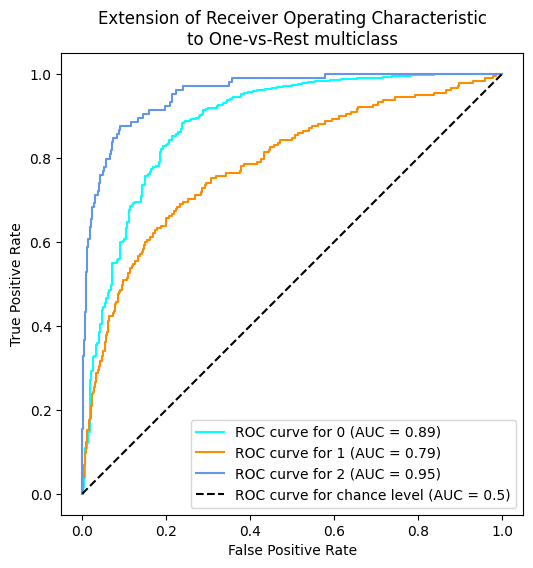

              precision    recall  f1-score   support

           0       0.98      0.84      0.91      4003
           1       0.15      0.58      0.24       177
           2       0.41      0.66      0.51       104

    accuracy                           0.83      4284
   macro avg       0.52      0.70      0.55      4284
weighted avg       0.93      0.83      0.87      4284

##################################################  Train all evaluate bad quality  ##################################################


####################  Logistic Regression  ####################


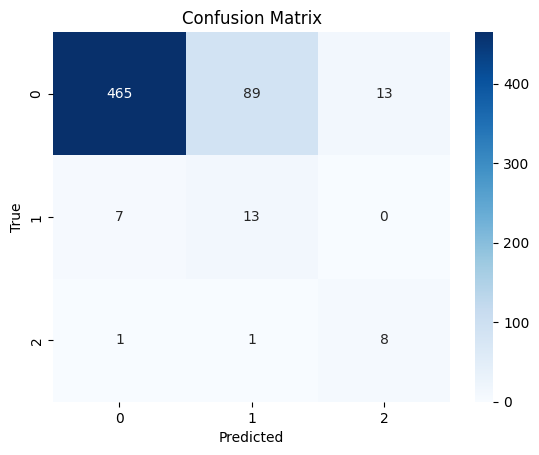

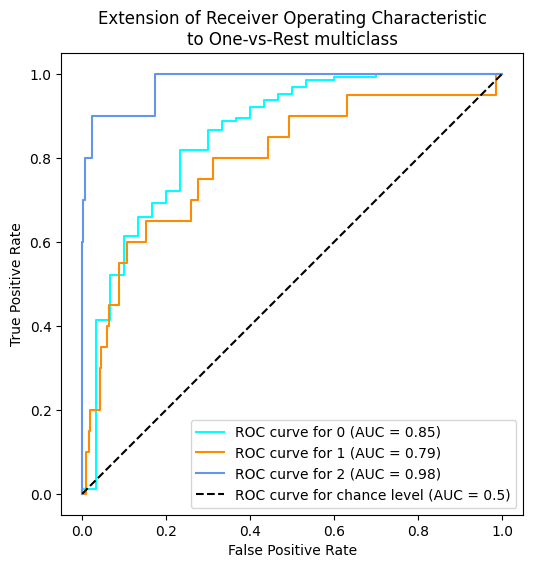

              precision    recall  f1-score   support

           0       0.98      0.82      0.89       567
           1       0.13      0.65      0.21        20
           2       0.38      0.80      0.52        10

    accuracy                           0.81       597
   macro avg       0.50      0.76      0.54       597
weighted avg       0.94      0.81      0.87       597



In [5]:
LABEL = 'DR_ICDR'
DR_ICDR_3= True

run_experiments(LABELS_PATH, LABEL, EMBEDDINGS_BACKBONE, EMBEDDINGS_DIR, TEST_SIZE, CLASS_WEIGTHS, DR_ICDR_3=DR_ICDR_3, quality=quality)

### 2 Class

Training set size is: 9995 rows and 1024 columns
Test set size is: 4284 rows and 1024 columns


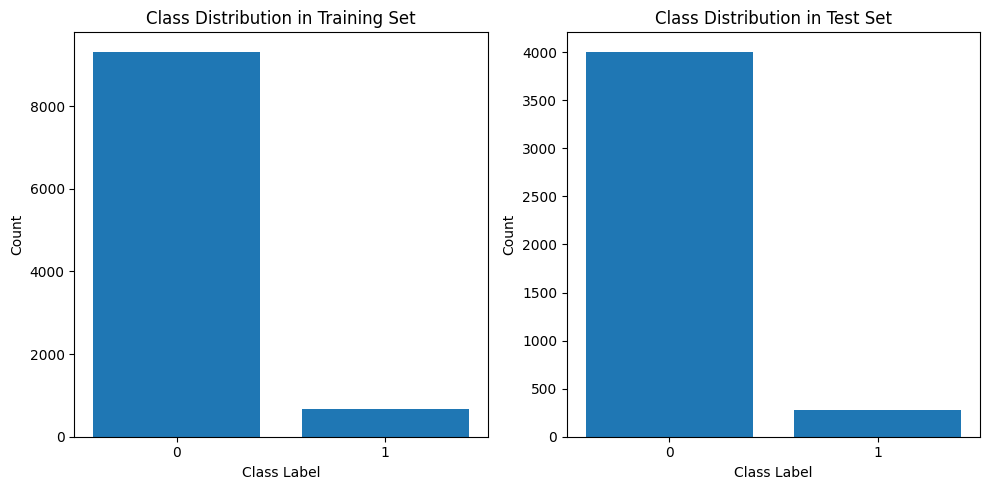

Training set size is: 1390 rows and 1024 columns
Test set size is: 597 rows and 1024 columns


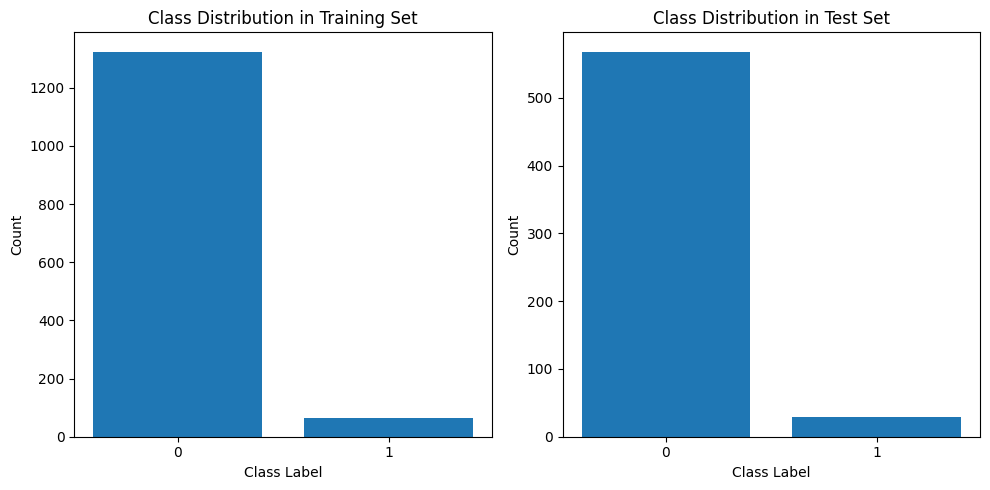

##################################################  GOOD QUALITY  ##################################################
Setting class weigths to: {0: 0.5347078715010333, 1: 7.70297699594046}
##################################################  Train all evaluate good quality  ##################################################


####################  Logistic Regression  ####################


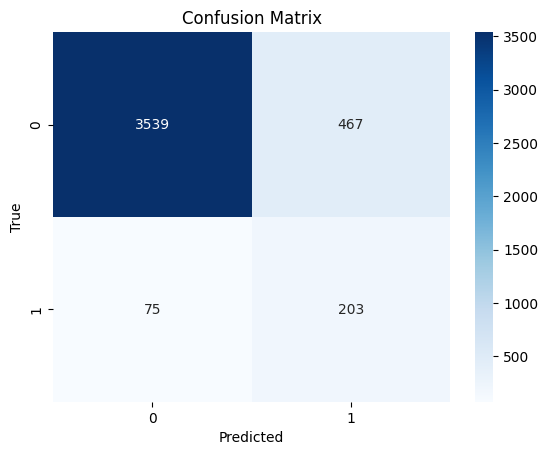

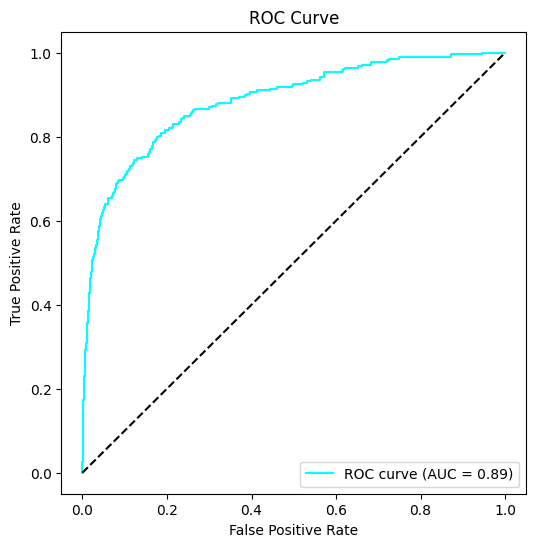

              precision    recall  f1-score   support

           0       0.98      0.88      0.93      4006
           1       0.30      0.73      0.43       278

    accuracy                           0.87      4284
   macro avg       0.64      0.81      0.68      4284
weighted avg       0.94      0.87      0.90      4284

##################################################  Train all evaluate bad quality  ##################################################


####################  Logistic Regression  ####################


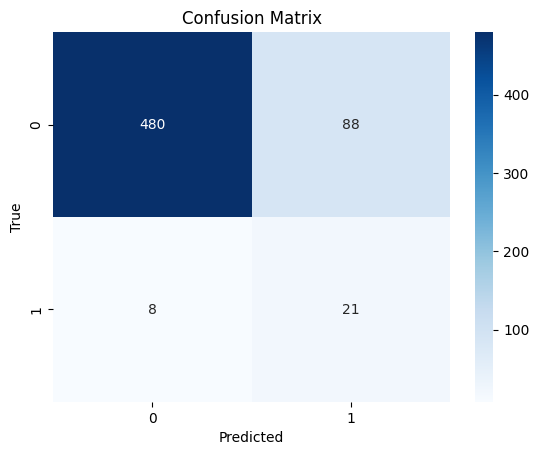

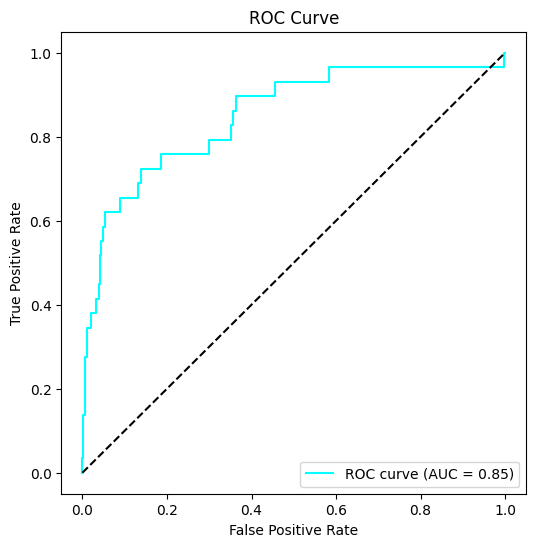

              precision    recall  f1-score   support

           0       0.98      0.85      0.91       568
           1       0.19      0.72      0.30        29

    accuracy                           0.84       597
   macro avg       0.59      0.78      0.61       597
weighted avg       0.95      0.84      0.88       597



In [6]:
LABEL = 'diabetic_retinopathy'
run_experiments(LABELS_PATH, LABEL, EMBEDDINGS_BACKBONE, EMBEDDINGS_DIR, TEST_SIZE, CLASS_WEIGTHS, quality=quality)